# <center> LIFE EXPECTANCY PREDICTION 

### In this project we will train a Linear Regression Model to predict Life Expectancy.
### This data was initially obtained from WHO and United Nations website. This data contains features like year,status,life expectancy,adult mortality,infant deaths,percentage of expenditure,alcohol.

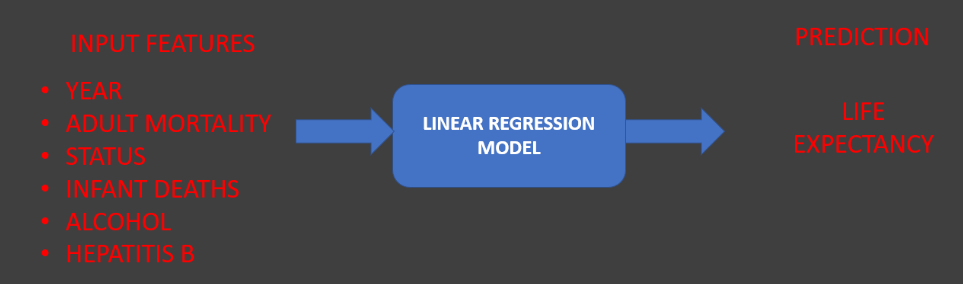

### Import dataset and required libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

from sklearn.preprocessing import LabelEncoder,StandardScaler,RobustScaler
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.model_selection import train_test_split,cross_val_score
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
from sklearn.feature_selection import f_regression,SelectKBest

import warnings
warnings.filterwarnings('ignore')

In [2]:
# read csv file
life_expectancy_df = pd.read_csv("./Life_Expectancy_Data.csv")

In [3]:
pd.set_option('display.max_columns',22)
life_expectancy_df


,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [4]:
life_expectancy_df.shape

(2938, 21)

In [5]:
life_expectancy_df.columns

Index(['Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [6]:
# Renaming columns
life_expectancy_df.rename(columns={ 'Life expectancy ': 'Life_expectancy', 'Adult Mortality':'Adult_Mortality',
       'infant deaths':'infant_deaths','percentage expenditure':'percentage_expenditure', 'under-five deaths ':'under_five_deaths ',
        'Total expenditure':'Total_expenditure',' thinness  1-19 years':'thinness1-19years',' thinness 5-9 years':'thinness5-9years',
       'Income composition of resources':'Incomecompositionofresources','Hepatitis B':'Hepatitis_B'},inplace=True)

In [7]:
life_expectancy_df.columns = life_expectancy_df.columns.str.replace(" ","")

In [8]:
life_expectancy_df

,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
0,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004,Developing,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,2003,Developing,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,2002,Developing,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,2001,Developing,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [9]:
life_expectancy_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 21 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Year                          2938 non-null   int64  
 1   Status                        2938 non-null   object 
 2   Life_expectancy               2928 non-null   float64
 3   Adult_Mortality               2928 non-null   float64
 4   infant_deaths                 2938 non-null   int64  
 5   Alcohol                       2744 non-null   float64
 6   percentage_expenditure        2938 non-null   float64
 7   Hepatitis_B                   2385 non-null   float64
 8   Measles                       2938 non-null   int64  
 9   BMI                           2904 non-null   float64
 10  under_five_deaths             2938 non-null   int64  
 11  Polio                         2919 non-null   float64
 12  Total_expenditure             2712 non-null   float64
 13  Dip

In [10]:
life_expectancy_df.isnull().mean()[np.where(life_expectancy_df.isnull().sum() != 0)[0]]

Life_expectancy                 0.003404
Adult_Mortality                 0.003404
Alcohol                         0.066031
Hepatitis_B                     0.188223
BMI                             0.011572
Polio                           0.006467
Total_expenditure               0.076923
Diphtheria                      0.006467
GDP                             0.152485
Population                      0.221920
thinness1-19years               0.011572
thinness5-9years                0.011572
Incomecompositionofresources    0.056841
Schooling                       0.055480
dtype: float64

In [11]:
# Perfoming one hot encoding on status column
life_expectancy_df['Status'] = pd.get_dummies(data=life_expectancy_df.Status,drop_first=True)
life_expectancy_df

,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
0,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004,1,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,2003,1,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,2002,1,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,2001,1,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [12]:
# most of the values are continuous,filling nan values with mean
life_expectancy_df = life_expectancy_df.apply(lambda x: x.fillna(x.mean()),axis=0)

In [13]:
life_expectancy_df.isnull().sum()

Year                            0
Status                          0
Life_expectancy                 0
Adult_Mortality                 0
infant_deaths                   0
Alcohol                         0
percentage_expenditure          0
Hepatitis_B                     0
Measles                         0
BMI                             0
under_five_deaths               0
Polio                           0
Total_expenditure               0
Diphtheria                      0
HIV/AIDS                        0
GDP                             0
Population                      0
thinness1-19years               0
thinness5-9years                0
Incomecompositionofresources    0
Schooling                       0
dtype: int64

In [14]:
life_expectancy_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Status,2938.0,8.257318e-01,3.794045e-01,0.00000,1.000000,1.000000e+00,1.000000e+00,1.000000e+00
Life_expectancy,2938.0,6.922493e+01,9.507640e+00,36.30000,63.200000,7.200000e+01,7.560000e+01,8.900000e+01
Adult_Mortality,2938.0,1.647964e+02,1.240803e+02,1.00000,74.000000,1.440000e+02,2.270000e+02,7.230000e+02
infant_deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2938.0,4.602861e+00,3.916288e+00,0.01000,1.092500,4.160000e+00,7.390000e+00,1.787000e+01
percentage_expenditure,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
Hepatitis_B,2938.0,8.094046e+01,2.258685e+01,1.00000,80.940461,8.700000e+01,9.600000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2938.0,3.832125e+01,1.992768e+01,1.00000,19.400000,4.300000e+01,5.610000e+01,8.730000e+01


### Exploratory data analysis and visualisation

In [15]:
life_expectancy_df

,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
0,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2933,2004,1,44.3,723.0,27,4.36,0.000000,68.0,31,27.1,42,67.0,7.13,65.0,33.6,454.366654,12777511.0,9.4,9.4,0.407,9.2
2934,2003,1,44.5,715.0,26,4.06,0.000000,7.0,998,26.7,41,7.0,6.52,68.0,36.7,453.351155,12633897.0,9.8,9.9,0.418,9.5
2935,2002,1,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,2001,1,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


In [16]:
life_expectancy_df.columns

Index(['Year', 'Status', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths',
       'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI',
       'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness1-19years',
       'thinness5-9years', 'Incomecompositionofresources', 'Schooling'],
      dtype='object')

In [17]:
num_cols = ['Life_expectancy','Adult_Mortality','infant_deaths','Alcohol','percentage_expenditure','Hepatitis_B','Measles','BMI',
           'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria','HIV/AIDS', 'GDP', 'Population', 'thinness1-19years',
       'thinness5-9years', 'Incomecompositionofresources', 'Schooling']

In [18]:
palette = itertools.cycle(sns.color_palette())

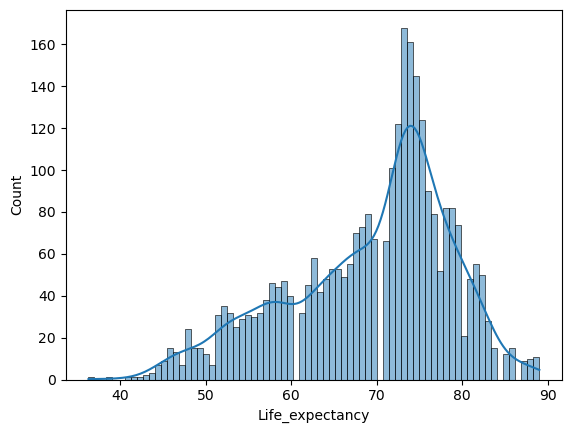

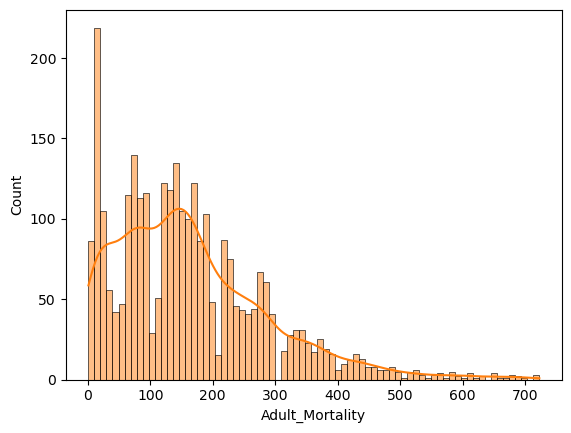

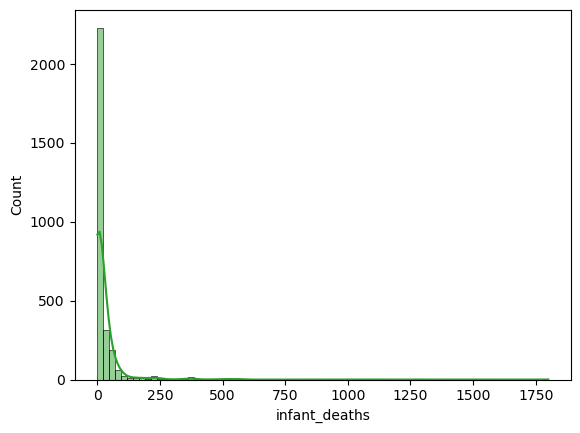

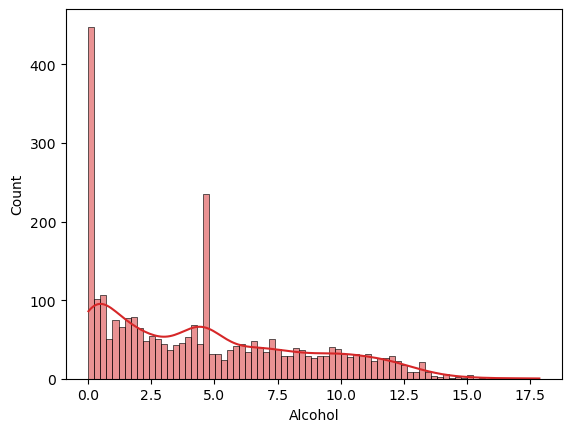

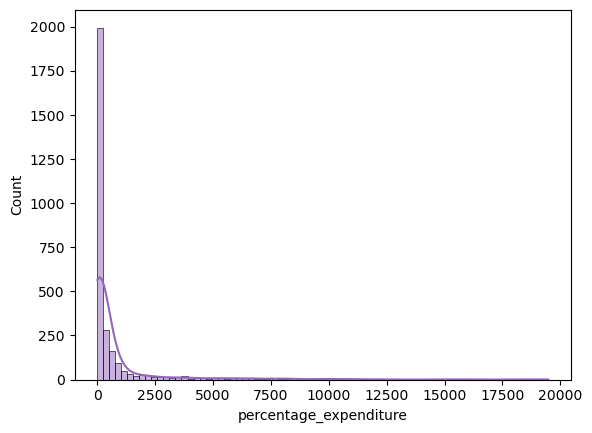

...

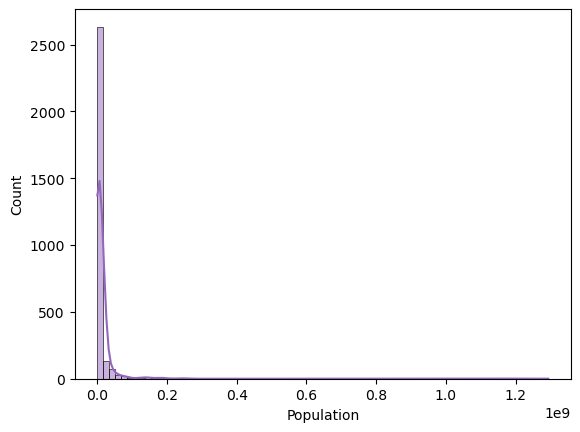

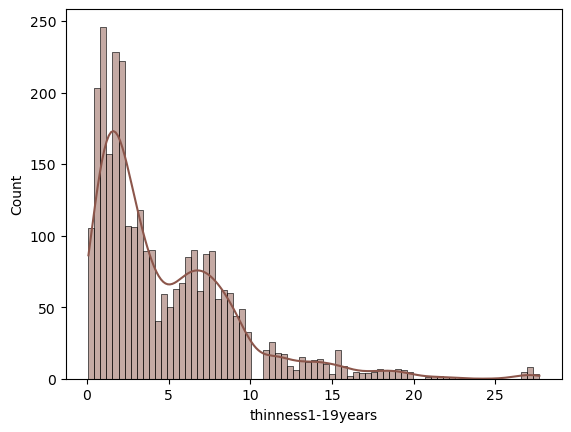

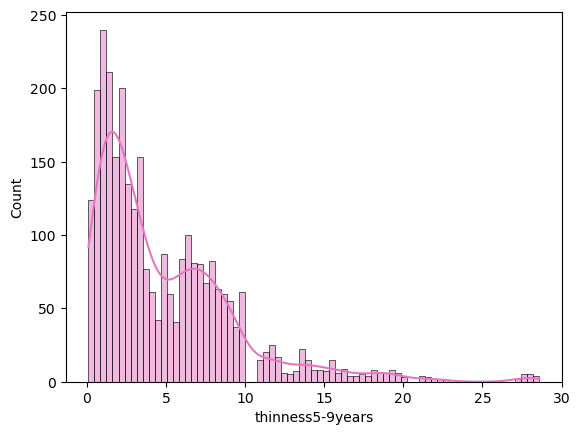

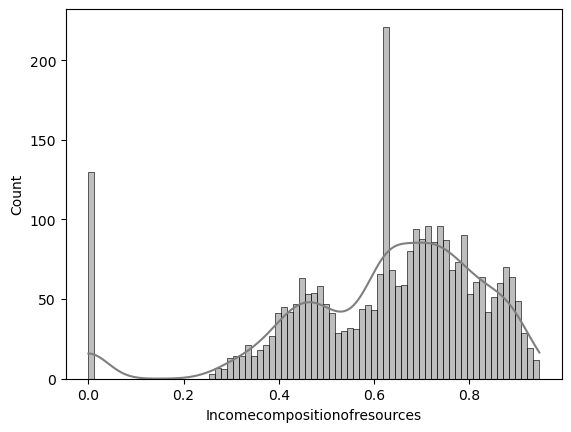

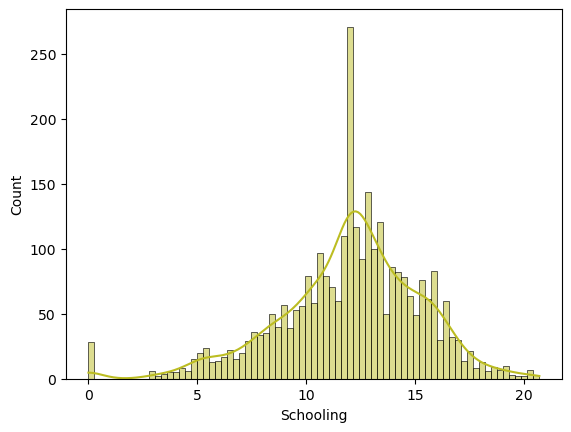

In [19]:
# Histogram
for i in num_cols:
    sns.histplot(x=life_expectancy_df[i],kde=True,color=next(palette),bins=75)
    plt.show()

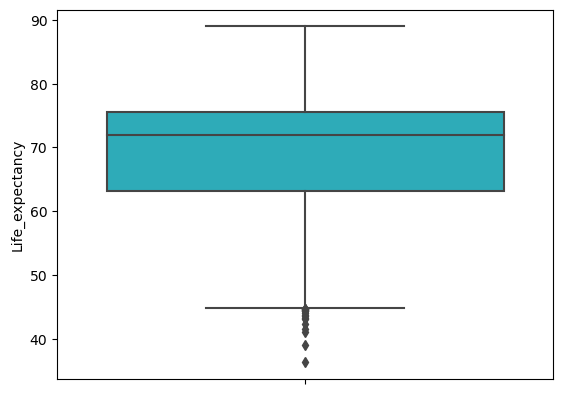

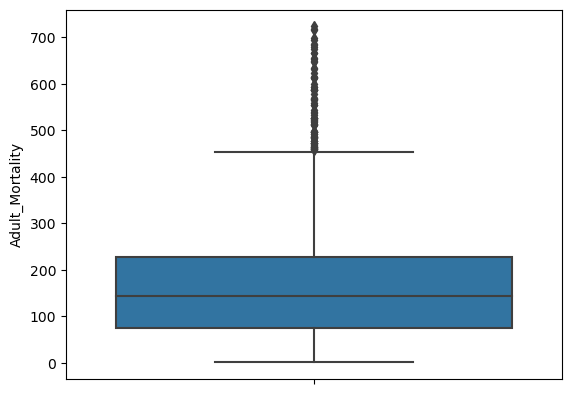

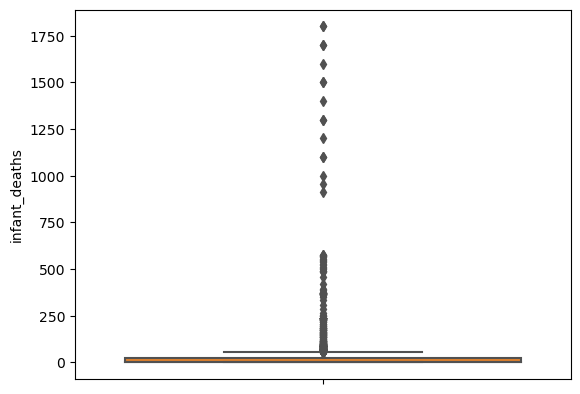

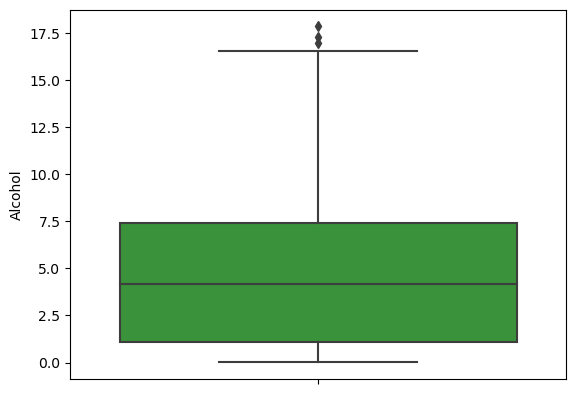

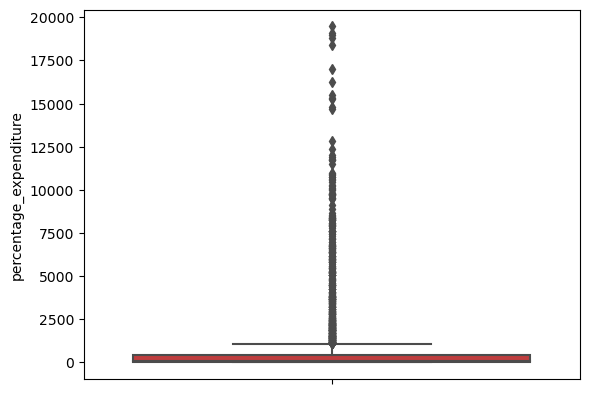

...

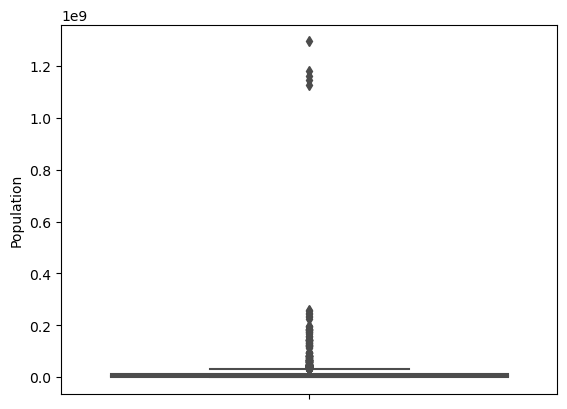

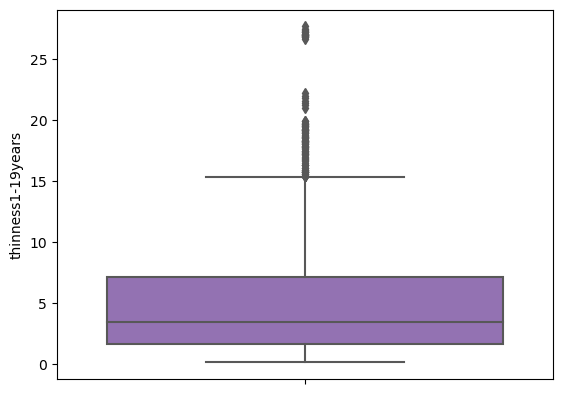

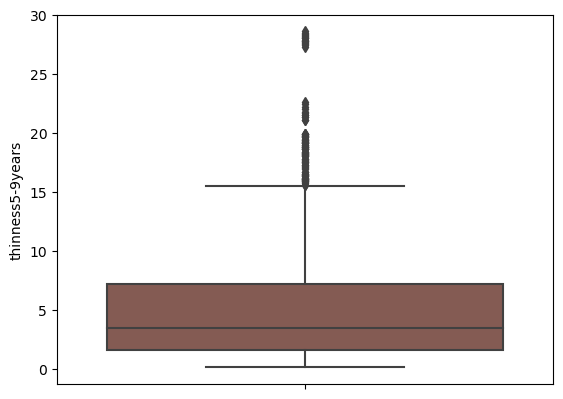

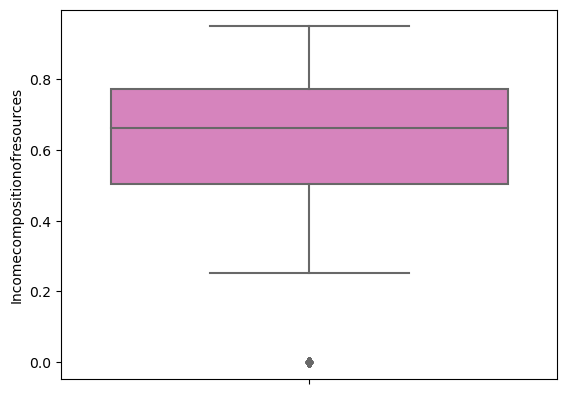

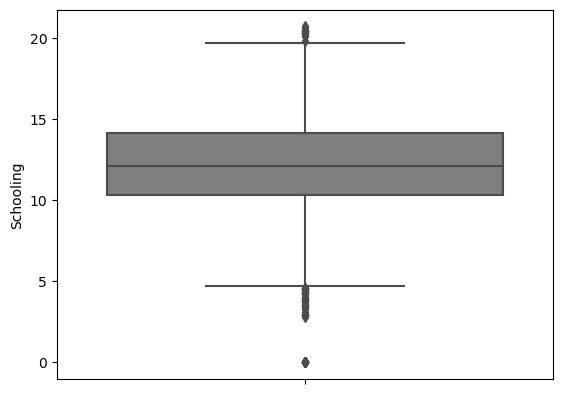

In [20]:
# Boxplot
for i in num_cols:
    sns.boxplot(y=life_expectancy_df[i],color=next(palette))
    plt.show()

In [21]:
# Outlier treatment
def outerlimit(col):
    Q3,Q1 = np.nanpercentile(col,[75,25])
    IQR = Q3-Q1
    UL = Q3+1.5*IQR
    LL = Q1-1.5*IQR
    return UL,LL

In [22]:
UL,LL = outerlimit(life_expectancy_df.Life_expectancy)
life_expectancy_df['Life_expectancy'] = np.where((life_expectancy_df.Life_expectancy>UL) | (life_expectancy_df.Life_expectancy<LL),\
                                                 np.nan,life_expectancy_df.Life_expectancy)

In [23]:
life_expectancy_df.dropna(inplace=True)

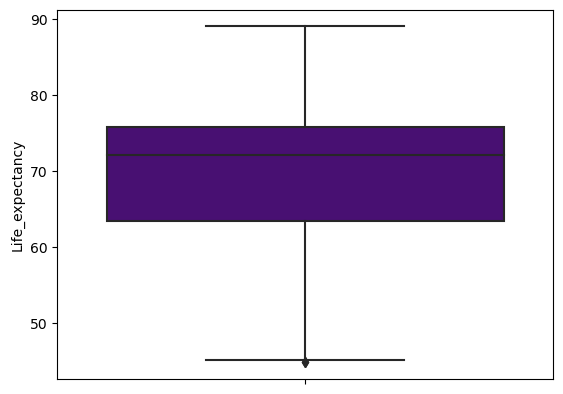

In [24]:
sns.boxplot(data=life_expectancy_df,y='Life_expectancy',color='indigo')
plt.show()

In [25]:
predictor_variables = ['Adult_Mortality','infant_deaths','Alcohol','percentage_expenditure','Hepatitis_B','Measles','BMI',
           'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria','HIV/AIDS', 'GDP', 'Population', 'thinness1-19years',
       'thinness5-9years', 'Incomecompositionofresources', 'Schooling']

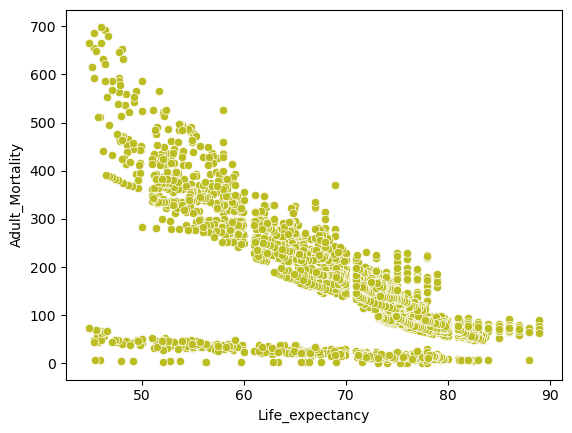

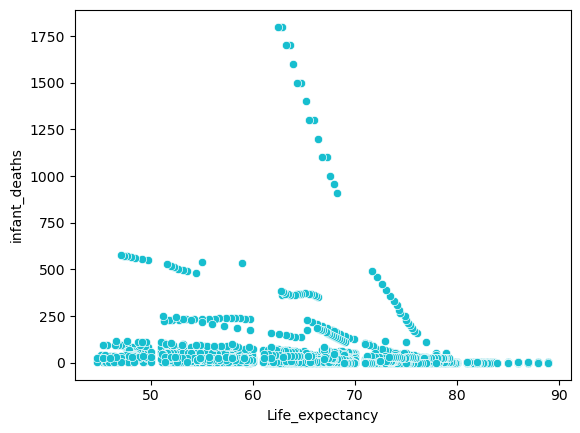

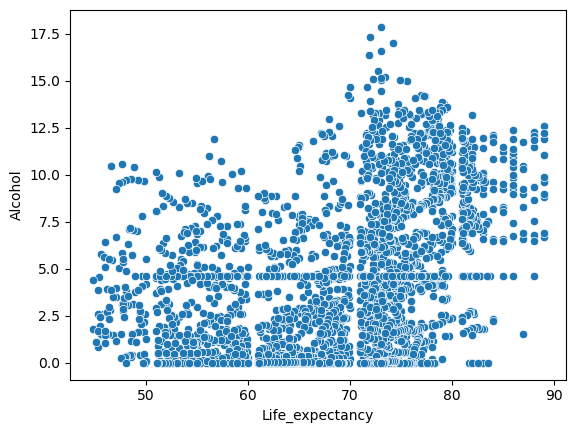

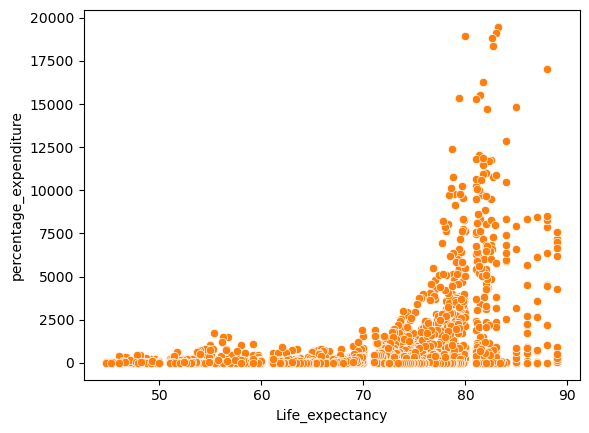

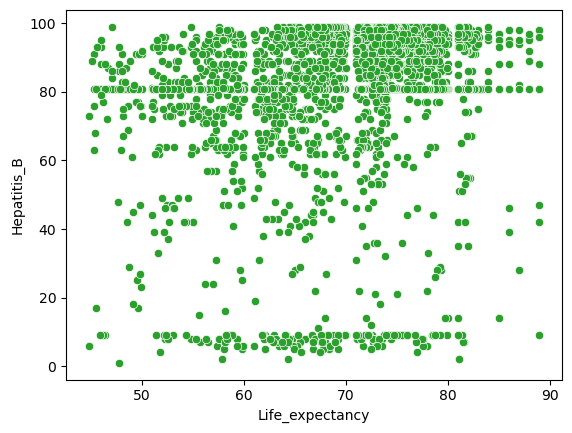

...

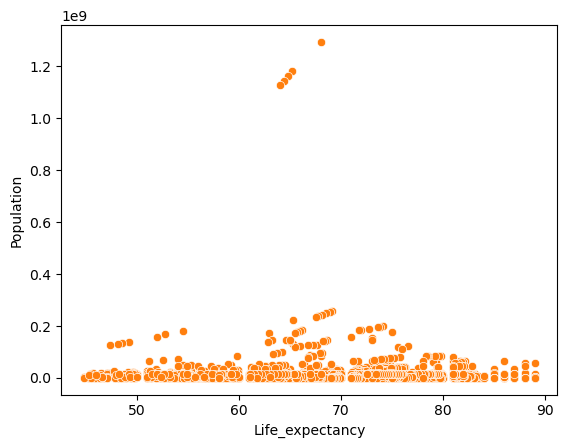

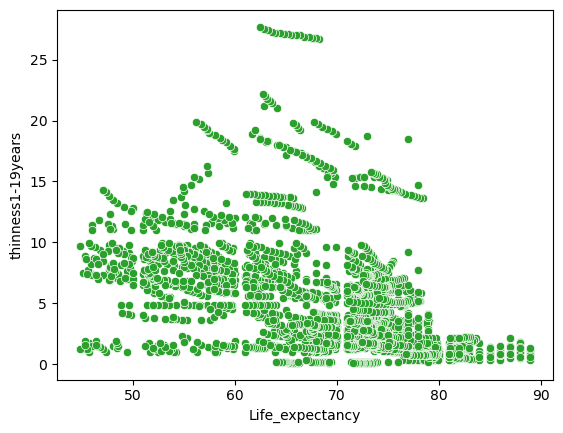

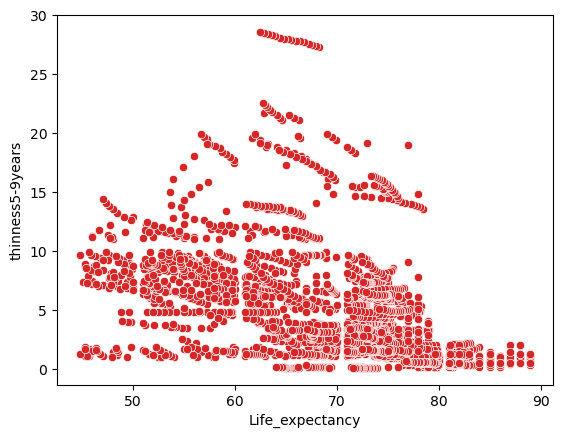

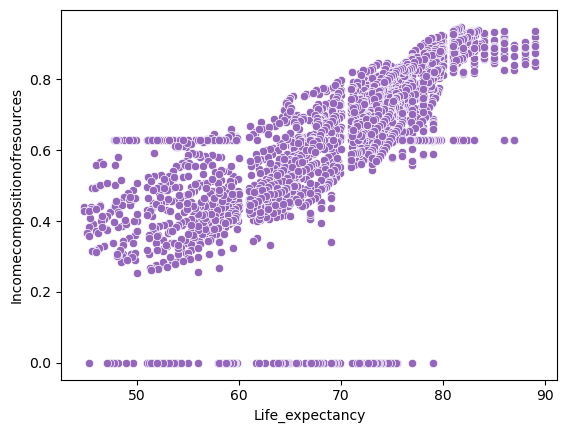

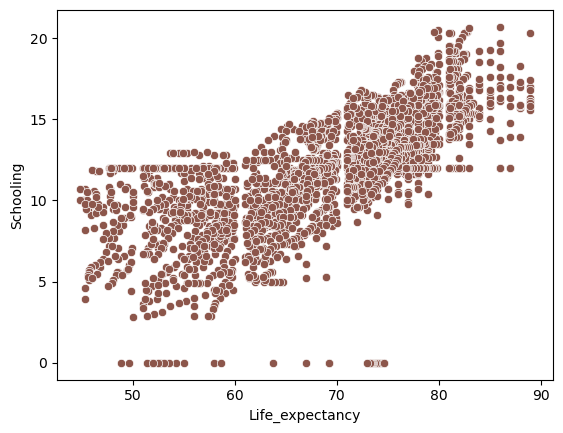

In [26]:
# scatterplot
for i in predictor_variables:
    sns.scatterplot(data=life_expectancy_df,x='Life_expectancy',y=life_expectancy_df[i],color=next(palette))
    plt.show()

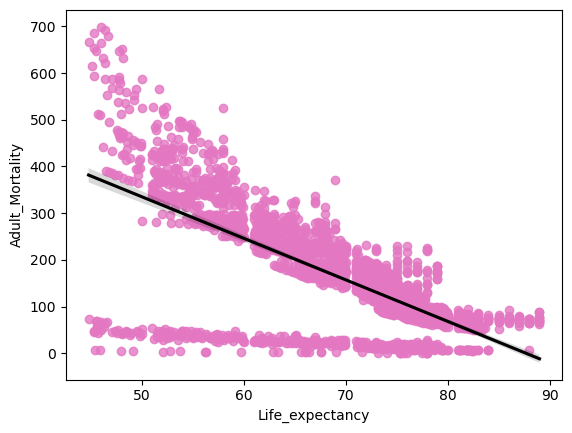

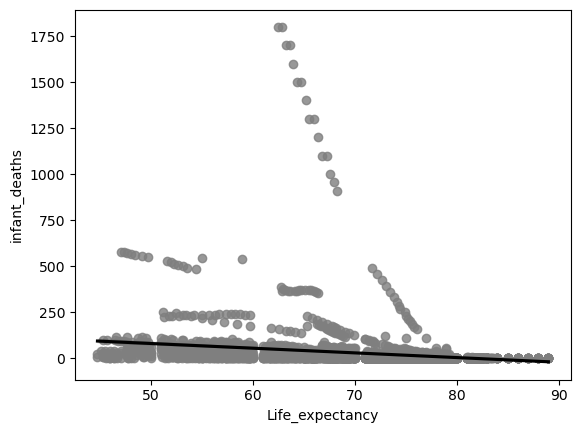

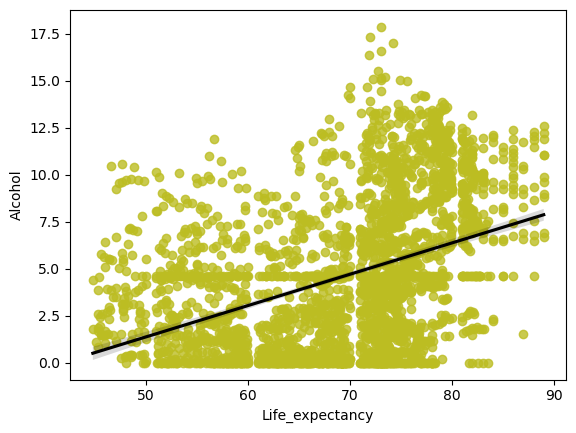

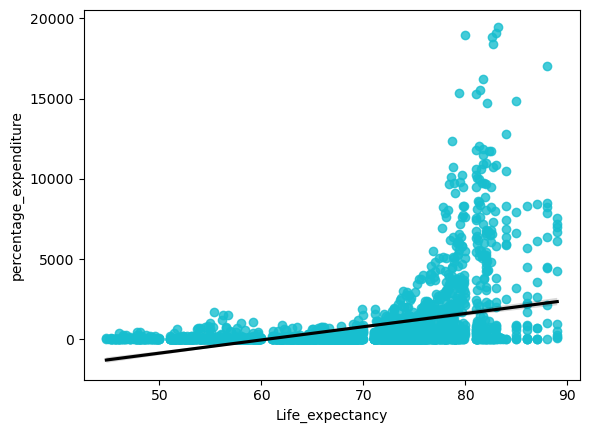

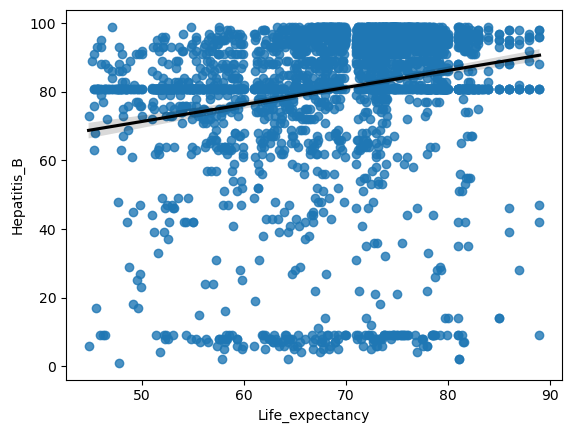

...

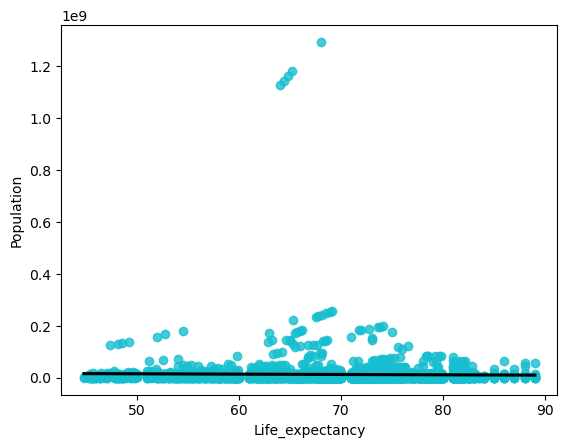

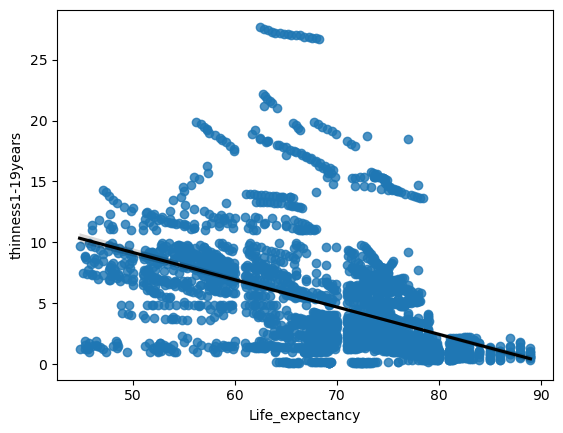

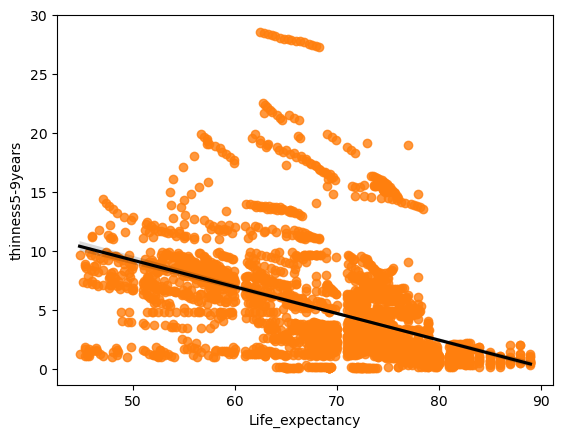

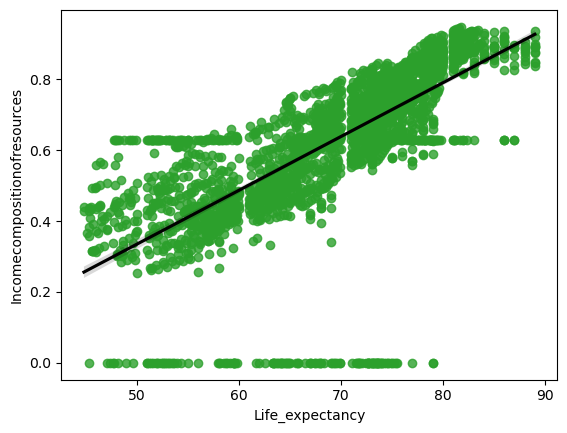

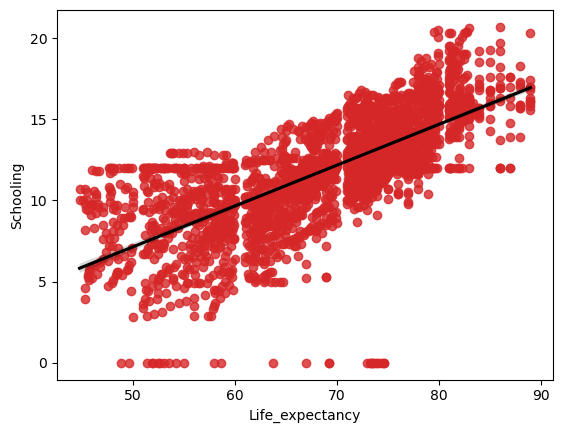

In [27]:
# Regplot
for i in predictor_variables:
    sns.regplot(data=life_expectancy_df,x='Life_expectancy',y=life_expectancy_df[i],color=next(palette),line_kws={"color": "black"})
    plt.show()

<Figure size 2000x2000 with 0 Axes>

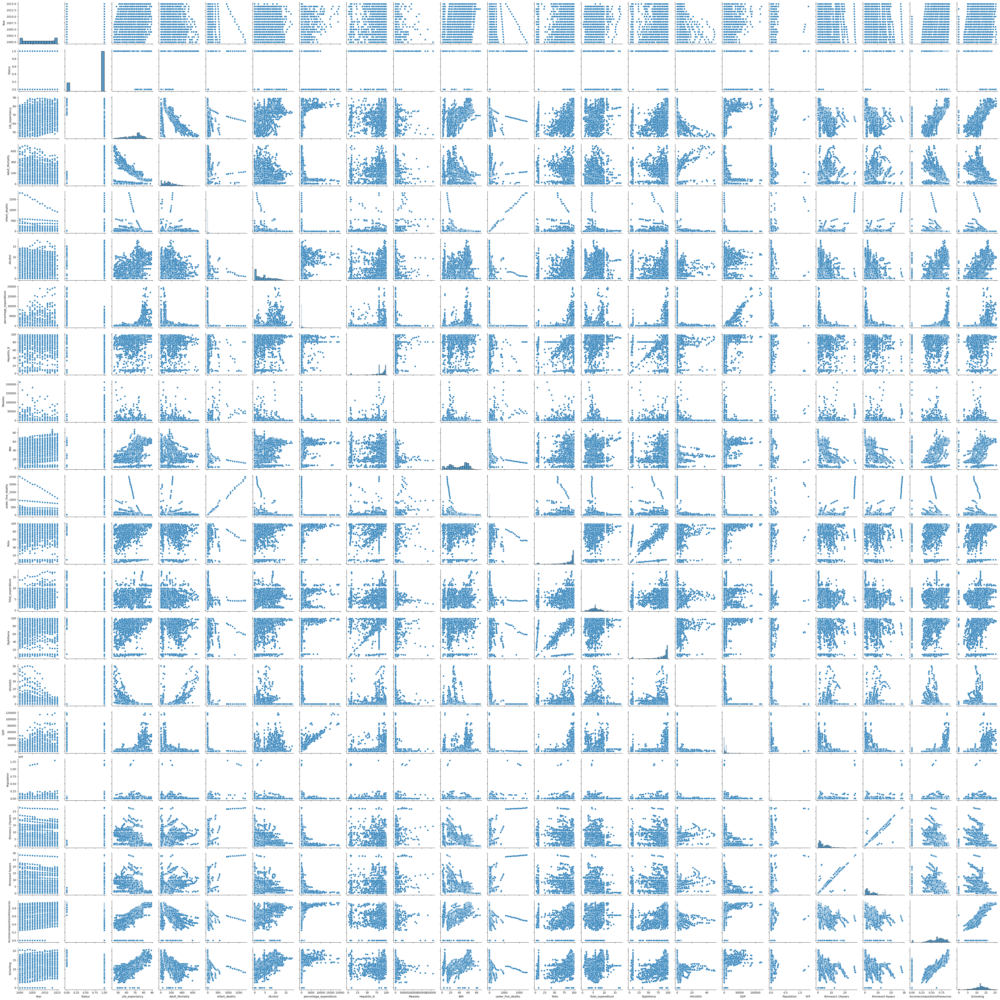

In [28]:
# Pairplot
plt.figure(figsize=(20,20))
sns.pairplot(data=life_expectancy_df);

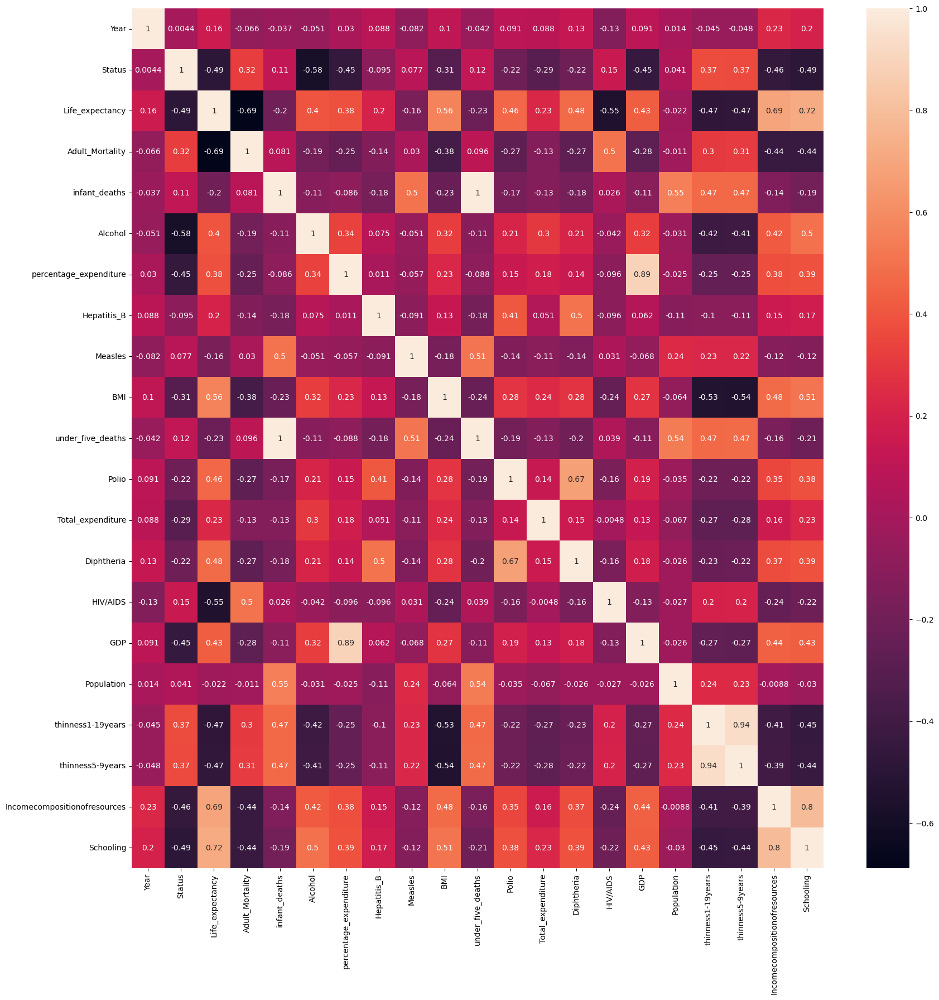

In [29]:
# Correlation matrix
plt.figure(figsize=(20,20))
corr_matrix = life_expectancy_df.corr()
sns.heatmap(corr_matrix,annot=True)
plt.show()

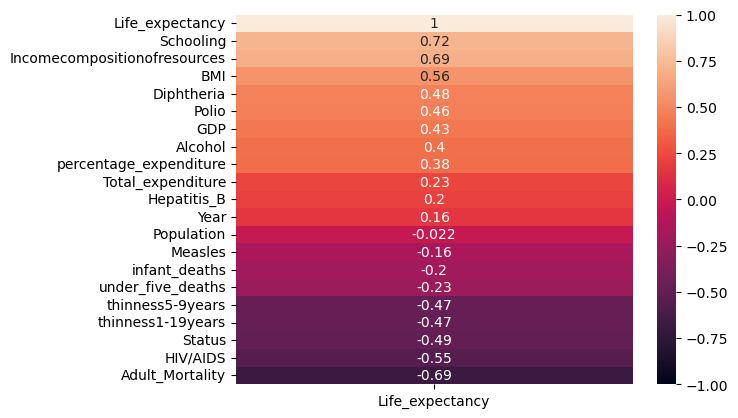

In [30]:
sns.heatmap(life_expectancy_df.corr()[['Life_expectancy']].sort_values(by='Life_expectancy',ascending=False),vmax=1,vmin=-1,annot=True)
plt.show()

In [31]:
life_expectancy_df

,Year,Status,Life_expectancy,Adult_Mortality,infant_deaths,Alcohol,percentage_expenditure,Hepatitis_B,Measles,BMI,under_five_deaths,Polio,Total_expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness1-19years,thinness5-9years,Incomecompositionofresources,Schooling
0,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,83,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,86,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,89,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,93,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,97,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2930,2007,1,46.6,67.0,29,3.88,29.814566,72.0,242,28.2,46,73.0,4.47,73.0,23.7,396.998217,1332999.0,8.2,8.2,0.414,9.6
2931,2006,1,45.4,7.0,28,4.57,34.262169,68.0,212,27.9,45,71.0,5.12,7.0,26.8,414.796232,13124267.0,8.6,8.6,0.408,9.5
2935,2002,1,44.8,73.0,25,4.43,0.000000,73.0,304,26.3,40,73.0,6.53,71.0,39.8,57.348340,125525.0,1.2,1.3,0.427,10.0
2936,2001,1,45.3,686.0,25,1.72,0.000000,76.0,529,25.9,39,76.0,6.16,75.0,42.1,548.587312,12366165.0,1.6,1.7,0.427,9.8


### Creating Testing and Training dataset

In [32]:
life_expectancy_df.columns

Index(['Year', 'Status', 'Life_expectancy', 'Adult_Mortality', 'infant_deaths',
       'Alcohol', 'percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI',
       'under_five_deaths', 'Polio', 'Total_expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness1-19years',
       'thinness5-9years', 'Incomecompositionofresources', 'Schooling'],
      dtype='object')

In [33]:
x = life_expectancy_df[['Incomecompositionofresources', 'Schooling','BMI','percentage_expenditure', 'Hepatitis_B', 'Measles', 'BMI',
        'Polio', 'Total_expenditure', 'Diphtheria','GDP']].values

In [34]:
y = life_expectancy_df[['Life_expectancy']].values

### Feature selection with all features

In [37]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,shuffle=True,random_state=None)

In [38]:
fs = SelectKBest(score_func=f_regression,k='all')

In [39]:
fs.fit(x_train,y_train)

SelectKBest(k='all', score_func=<function f_regression at 0x000001D449631550>)

In [40]:
for i in range(len(fs.scores_)):
     print(f"Feature is :{i} and score is {fs.scores_[i]}")

Feature is :0 and score is 1982.1910425531764
Feature is :1 and score is 2404.8980590493434
Feature is :2 and score is 983.8580686833717
Feature is :3 and score is 381.8116116892418
Feature is :4 and score is 103.70737949006748
Feature is :5 and score is 55.7689538651102
Feature is :6 and score is 983.8580686833717
Feature is :7 and score is 616.9675347630945
Feature is :8 and score is 130.71011062387805
Feature is :9 and score is 657.4909588329803
Feature is :10 and score is 514.2441598636294


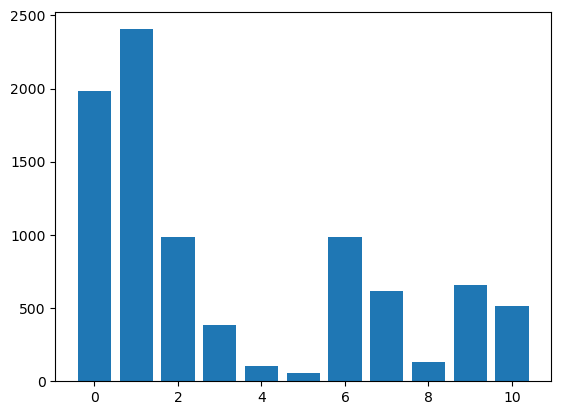

In [41]:
# Scores plotting in bar graph
plt.bar([i for i in range(len(fs.scores_))],fs.scores_)
plt.show()

In [42]:
# Selecting k=8
fs = SelectKBest(score_func=f_regression,k=8)

In [43]:
fs.fit(x_train,y_train)

SelectKBest(k=8, score_func=<function f_regression at 0x000001D449631550>)

In [44]:
### Model building
models = {
    "LinearRegression":LinearRegression(),
    "Ridge":Ridge(),
     "Lasso":Lasso()
    }

In [45]:
for name,model in models.items():
    scores = cross_val_score(model,x,y,scoring="neg_mean_squared_error",cv=10,n_jobs=-1)
    print("Cross validation model : {}".format(name))
    rmse = np.sqrt(-scores)
    rmse_avg =np.mean(rmse)
    print("Average rsme :",rmse_avg)
    print("*"*100)

Cross validation model : LinearRegression
Average rsme : 5.613842660443689
****************************************************************************************************
Cross validation model : Ridge
Average rsme : 5.613996762562896
****************************************************************************************************
Cross validation model : Lasso
Average rsme : 5.76256737297602
****************************************************************************************************


In [46]:
x_train_fs= fs.transform(x_train)
x_test_fs = fs.transform(x_test)

In [47]:
# Linear Regression
LR_model = LinearRegression()

In [48]:
LR_model.fit(x_train_fs,y_train)

LinearRegression()

In [49]:
y_pred_fs = LR_model.predict(x_test_fs)

In [50]:
print("r2-score:",r2_score(y_test,y_pred_fs))

r2-score: 0.6977759872515622


In [51]:
print("Testing score:",LR_model.score(x_test_fs,y_test))

Testing score: 0.6977759872515622


In [52]:
print("Training score:",LR_model.score(x_train_fs,y_train))

Training score: 0.6267678386897482


In [53]:
print("MAE:",mean_absolute_error(y_test,y_pred_fs))

MAE: 3.89123674540571


In [54]:
print("MSE:",mean_squared_error(y_test,y_pred_fs))

MSE: 27.054679782903772


In [55]:
print("RMSE:",np.sqrt(mean_squared_error(y_test,y_pred_fs)))

RMSE: 5.201411326063703


In [56]:
OUTPUT = pd.DataFrame(zip(y_test,y_pred_fs),columns=['Actual','Prediction'],dtype=float)
OUTPUT.head()

,Actual,Prediction
0,71.1,67.288156
1,64.5,62.286422
2,73.4,72.097200
3,55.3,65.377057
4,82.0,79.702733


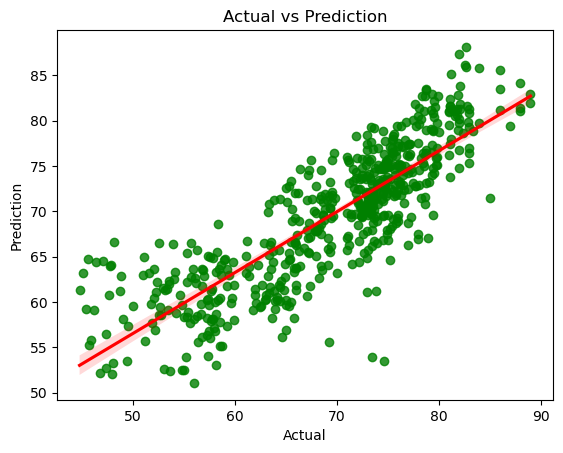

In [57]:
# Output 
plt.title("Actual vs Prediction")
sns.regplot(data=OUTPUT,x='Actual',y='Prediction',color='green',line_kws={'color':'red'})
plt.show()

### Using Ridge model

In [58]:
Ridge_model = Ridge()

In [59]:
Ridge_model.fit(x_train_fs,y_train)

Ridge()

In [60]:
y_pred_fs = Ridge_model.predict(x_test_fs)

In [61]:
print("r2-score:",r2_score(y_test,y_pred_fs))

r2-score: 0.6974127202802345


In [62]:
print("Testing score:",Ridge_model.score(x_test_fs,y_test))

Testing score: 0.6974127202802345


In [63]:
print("Training score:",Ridge_model.score(x_train_fs,y_train))

Training score: 0.6267560863506993
